In [1]:
%matplotlib inline
import os, glob, cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pdp

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

if os.name == 'nt':
    sep = '\\'
else:
    sep = '/'

In [2]:
data_dir = '../input'
os.listdir(data_dir)

['jpeg',
 'sample_submission.csv',
 'test',
 'test.csv',
 'tfrecords',
 'train',
 'train.csv',
 '_Alex_Dataset',
 '_Chris_Dataset_192',
 '_Chris_Dataset_256',
 '_Chris_Dataset_384',
 '_Chris_Dataset_512']

In [3]:
train = pd.read_csv(os.path.join(data_dir, 'train.csv'))
test = pd.read_csv(os.path.join(data_dir, 'test.csv'))

---
## Train

In [4]:
train.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0


In [5]:
pdp.ProfileReport(train)

---
## Test

In [6]:
pdp.ProfileReport(test)

---
## Image

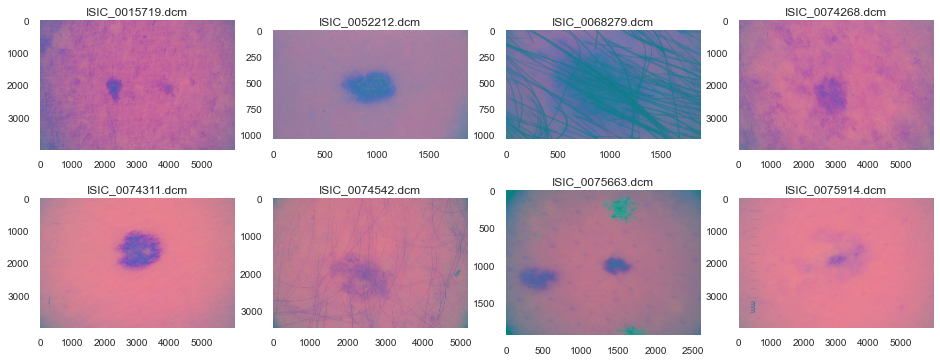

In [7]:
# .dcm
import pydicom

img_path = glob.glob(os.path.join(data_dir, 'train', '*.dcm'))
fig, axes = plt.subplots(ncols=4, nrows=2, figsize=(16, 6))

for i, ax in enumerate(axes.ravel()):
    d = pydicom.dcmread(img_path[i])
    img_name = img_path[i].split(sep)[-1]
    ax.imshow(d.pixel_array)
    ax.set_title(img_name)
plt.show()

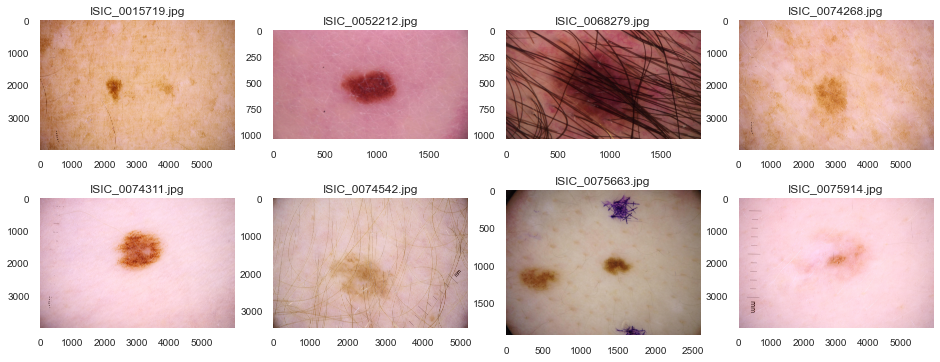

In [8]:
# .jpg
img_path = glob.glob(os.path.join(data_dir, 'jpeg', 'train', '*.jpg'))
fig, axes = plt.subplots(ncols=4, nrows=2, figsize=(16, 6))

for i, ax in enumerate(axes.ravel()):
    d = cv2.imread(img_path[i])
    d = cv2.cvtColor(d, cv2.COLOR_BGR2RGB)
    img_name = img_path[i].split(sep)[-1]
    ax.imshow(d)
    ax.set_title(img_name)
plt.show()

In [9]:
tar_name = [img_path[i].split(sep)[-1].split('.')[0] for i in range(8)]
train[train['image_name'].isin(tar_name)]

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0
5,ISIC_0074311,IP_2950485,female,40.0,lower extremity,unknown,benign,0
6,ISIC_0074542,IP_4698288,male,25.0,lower extremity,unknown,benign,0
7,ISIC_0075663,IP_6017204,female,35.0,torso,unknown,benign,0
8,ISIC_0075914,IP_7622888,male,30.0,torso,unknown,benign,0


In [41]:
def get_benign_malignant_images(train, img_num=6):
    # benign vs malignant
    benign_list = train[train['benign_malignant'] == 'benign'].sample(frac=1.0)['image_name'][:img_num].tolist()
    malignant_list = train[train['benign_malignant'] == 'malignant'].sample(frac=1.0)['image_name'][:img_num].tolist()

    tar_list = benign_list + malignant_list

    print('benign: ', benign_list)
    print('malignant: ', malignant_list)

    fig, axes = plt.subplots(ncols=img_num, nrows=2, figsize=(18, 6))

    for i, ax in enumerate(axes.ravel()):
        img_path = os.path.join(data_dir, 'train', tar_list[i] + '.dcm')

        d = pydicom.dcmread(img_path)
        ax.imshow(d.pixel_array)
        ax.set_title(tar_list[i])
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(ncols=img_num, nrows=2, figsize=(18, 6))

    for i, ax in enumerate(axes.ravel()):
        img_path = os.path.join(data_dir, 'jpeg', 'train', tar_list[i] + '.jpg')

        d = cv2.imread(img_path)
        d = cv2.cvtColor(d, cv2.COLOR_BGR2RGB)
        ax.imshow(d)
        ax.set_title(tar_list[i])
    plt.tight_layout()
    plt.show()

benign:  ['ISIC_5157962', 'ISIC_8276574', 'ISIC_2671727', 'ISIC_2910474', 'ISIC_8099453', 'ISIC_8348712']
malignant:  ['ISIC_6784593', 'ISIC_8493108', 'ISIC_3343475', 'ISIC_0833889', 'ISIC_2342769', 'ISIC_4967586']


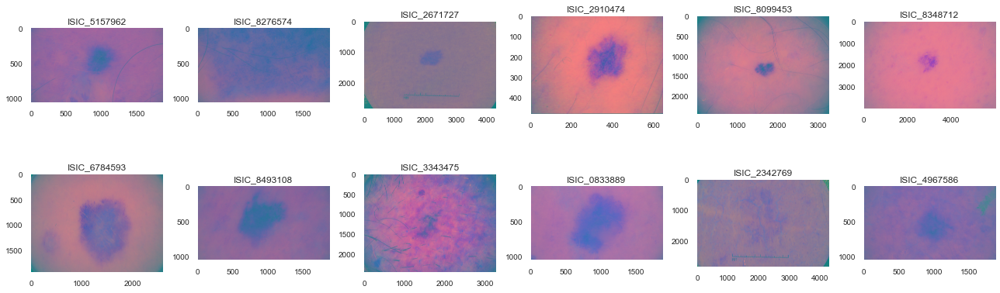

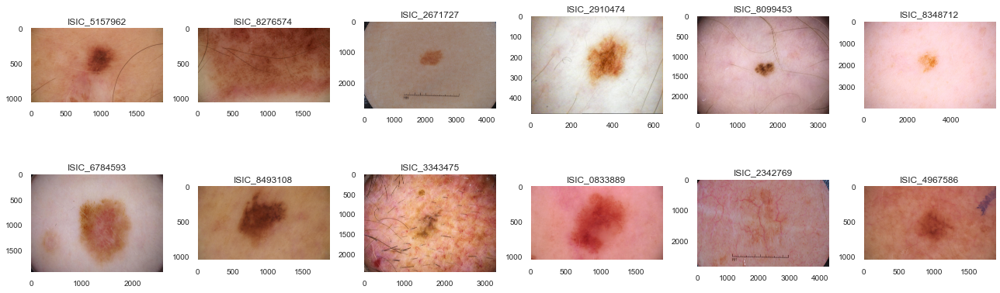

In [42]:
get_benign_malignant_images(train)

---
## Gender

benign:  ['ISIC_0663824', 'ISIC_5315125', 'ISIC_9132589', 'ISIC_5377977', 'ISIC_9235996', 'ISIC_2837876']
malignant:  ['ISIC_1569119', 'ISIC_1752943', 'ISIC_1037315', 'ISIC_7489564', 'ISIC_3002956', 'ISIC_7084553']


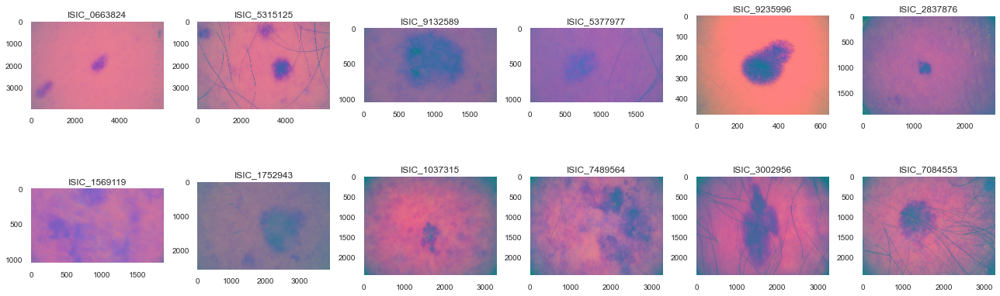

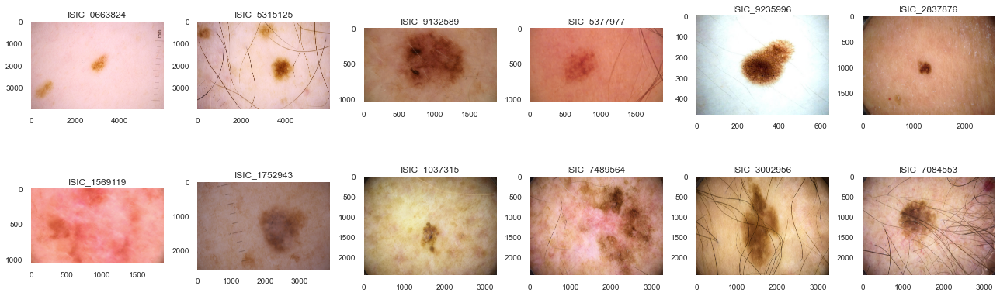

In [45]:
_train = train[train['sex'] == 'male'].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_6256726', 'ISIC_1648233', 'ISIC_7670737', 'ISIC_4151356', 'ISIC_3671424', 'ISIC_8352418']
malignant:  ['ISIC_3394520', 'ISIC_6671773', 'ISIC_1484659', 'ISIC_5272223', 'ISIC_6124481', 'ISIC_0914168']


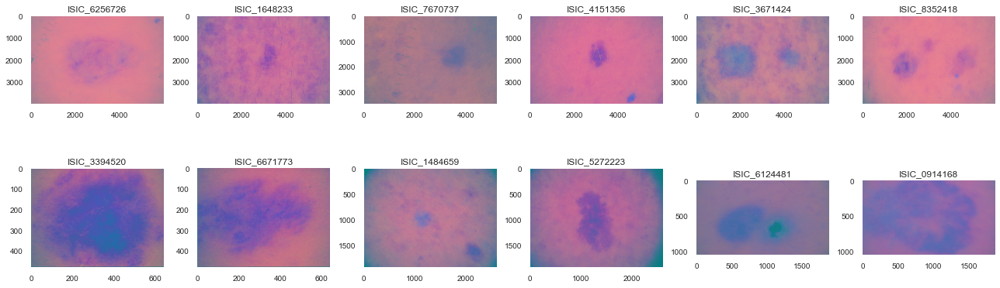

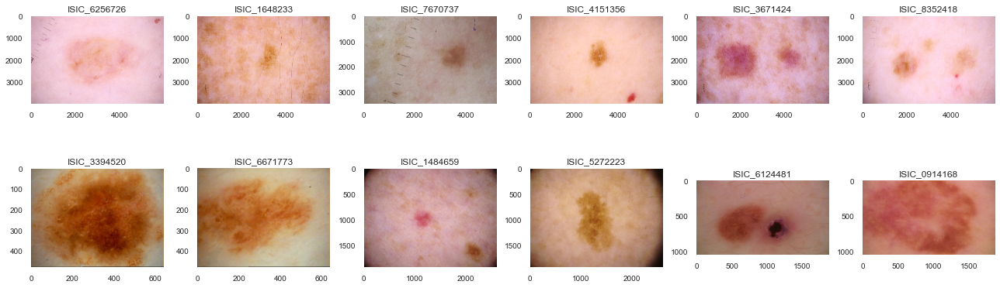

In [46]:
_train = train[train['sex'] == 'female'].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=6)

---
## Age

In [19]:
train['age_approx'].value_counts()

45.0    4466
50.0    4270
55.0    3824
40.0    3576
60.0    3240
35.0    2850
65.0    2527
30.0    2358
70.0    1968
25.0    1544
75.0     981
20.0     655
80.0     419
85.0     149
15.0     132
90.0      80
10.0      17
0.0        2
Name: age_approx, dtype: int64

benign:  ['ISIC_0713368', 'ISIC_7132685', 'ISIC_4751661', 'ISIC_6152426', 'ISIC_5593286', 'ISIC_2682788']
malignant:  ['ISIC_7233368', 'ISIC_5747486', 'ISIC_7658729', 'ISIC_6904082', 'ISIC_4223155', 'ISIC_6124481']


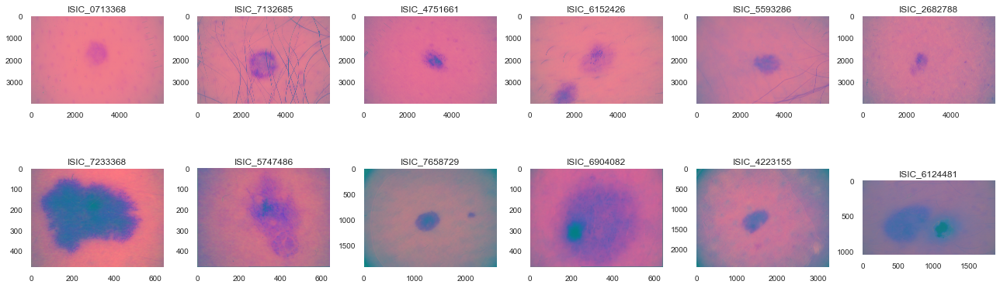

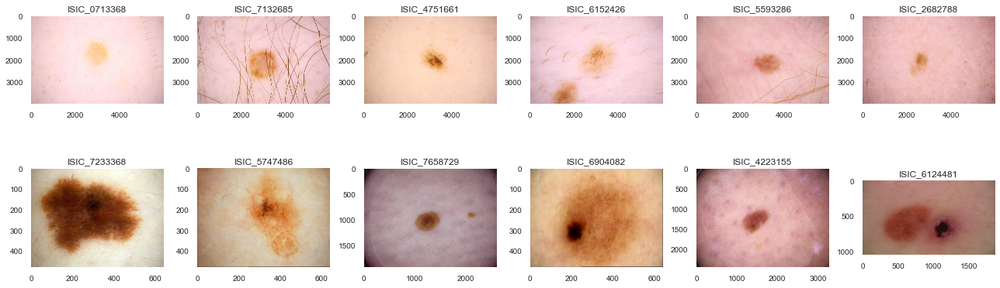

In [47]:
# 30歳以下
_train = train[train['age_approx'] < 30].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_2329310', 'ISIC_8679740', 'ISIC_7735102', 'ISIC_6772085', 'ISIC_9489038', 'ISIC_5976532']
malignant:  ['ISIC_3065032', 'ISIC_9785077', 'ISIC_1375476', 'ISIC_3093026', 'ISIC_4469476', 'ISIC_1356715']


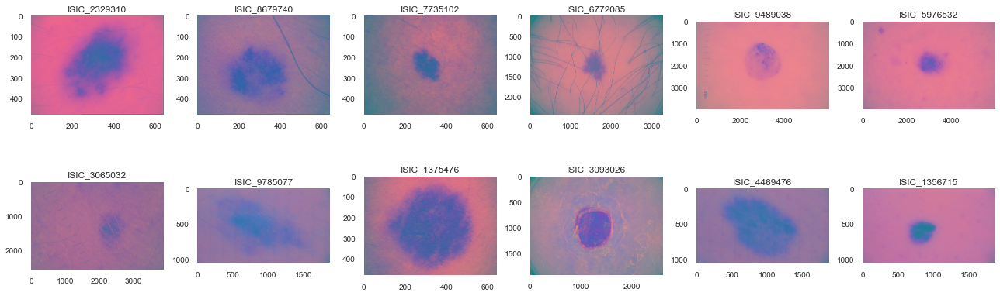

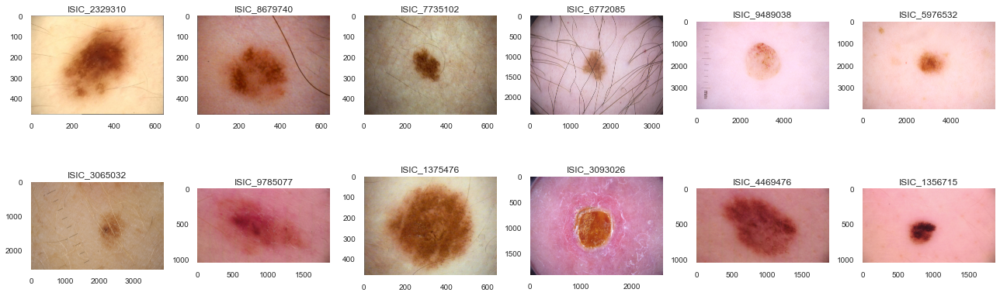

In [48]:
# 30代
_train = train[train['age_approx'] >= 30].reset_index(drop=True)
_train = _train[_train['age_approx'] < 40]
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_4523750', 'ISIC_2118143', 'ISIC_4025918', 'ISIC_1935814', 'ISIC_9694663', 'ISIC_0361149']
malignant:  ['ISIC_5747942', 'ISIC_7205745', 'ISIC_8068693', 'ISIC_7242384', 'ISIC_9000234', 'ISIC_0981639']


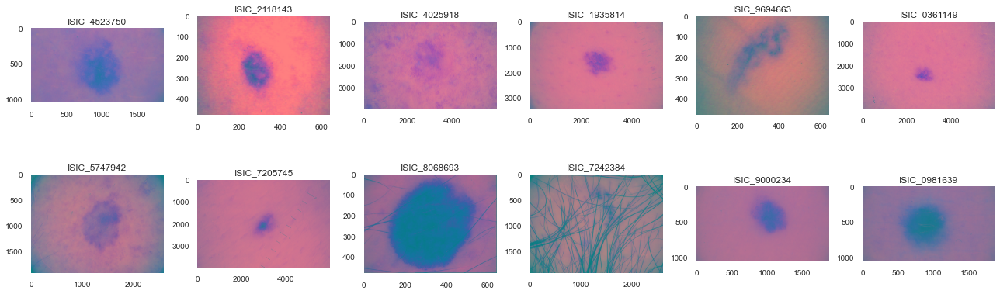

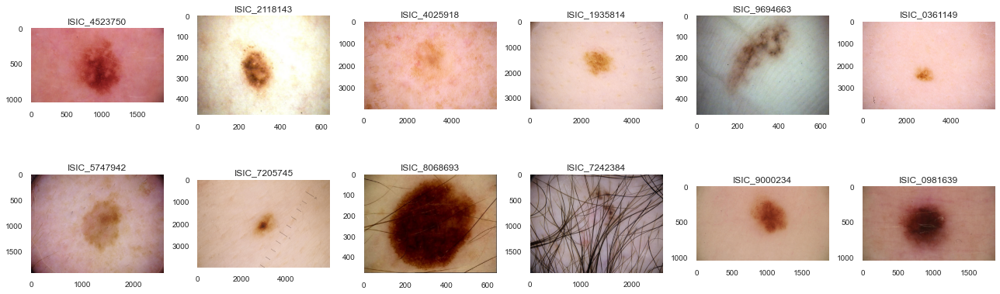

In [49]:
# 40代
_train = train[train['age_approx'] >= 40].reset_index(drop=True)
_train = _train[_train['age_approx'] < 50]
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_9616281', 'ISIC_7097002', 'ISIC_3435747', 'ISIC_1858123', 'ISIC_9365475', 'ISIC_0600866']
malignant:  ['ISIC_5867911', 'ISIC_6829008', 'ISIC_1157032', 'ISIC_1975042', 'ISIC_5714411', 'ISIC_2822718']


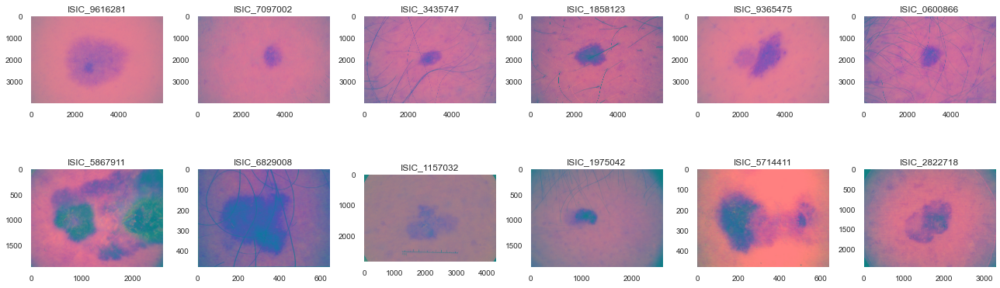

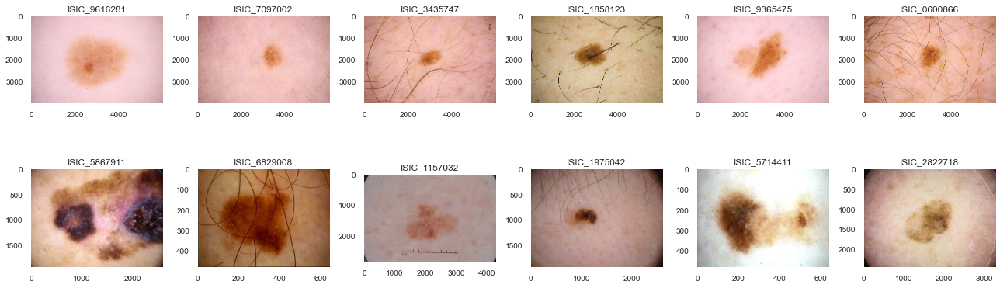

In [50]:
# 50代
_train = train[train['age_approx'] >= 50].reset_index(drop=True)
_train = _train[_train['age_approx'] < 60]
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_9681146', 'ISIC_3523444', 'ISIC_6065905', 'ISIC_4176815', 'ISIC_7175030', 'ISIC_1349353']
malignant:  ['ISIC_3446357', 'ISIC_1706912', 'ISIC_6089318', 'ISIC_5425721', 'ISIC_4730066', 'ISIC_8615491']


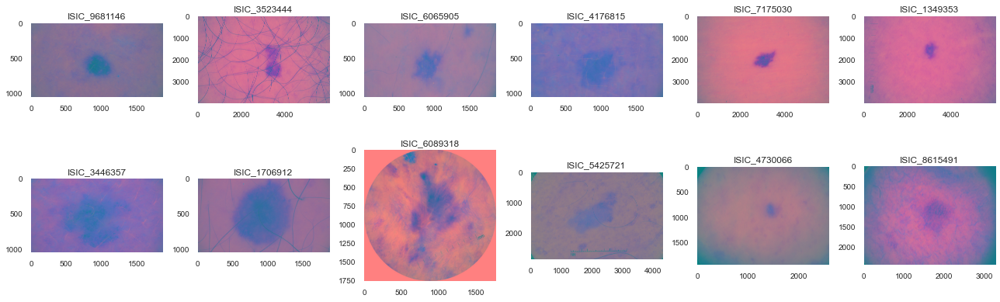

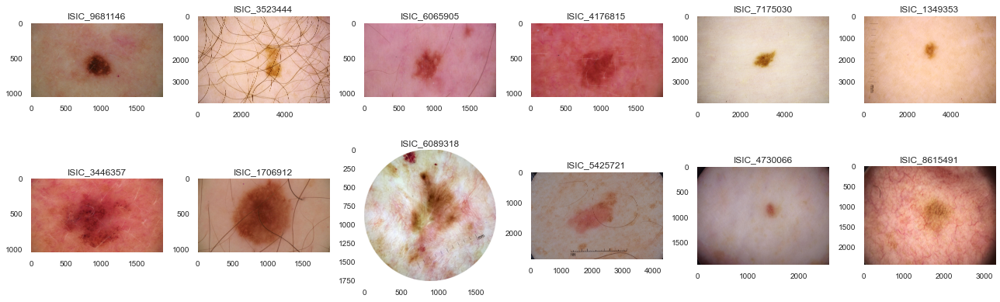

In [51]:
# 60代
_train = train[train['age_approx'] >= 60].reset_index(drop=True)
_train = _train[_train['age_approx'] < 70]
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_3760025', 'ISIC_8362460', 'ISIC_0188955', 'ISIC_0552953', 'ISIC_3566897', 'ISIC_1100216']
malignant:  ['ISIC_5797062', 'ISIC_3561065', 'ISIC_6392461', 'ISIC_9509757', 'ISIC_4378189', 'ISIC_6056121']


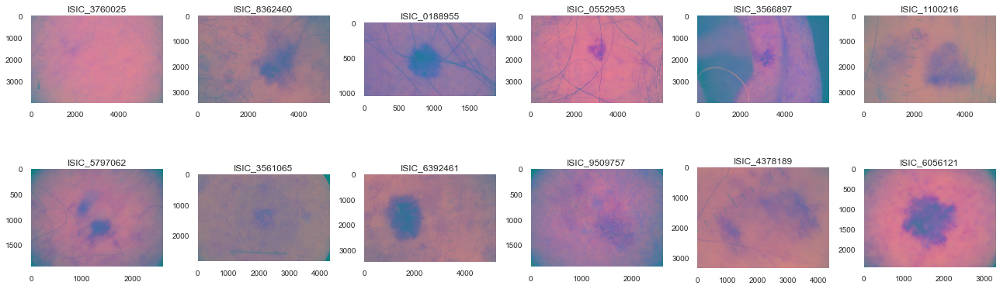

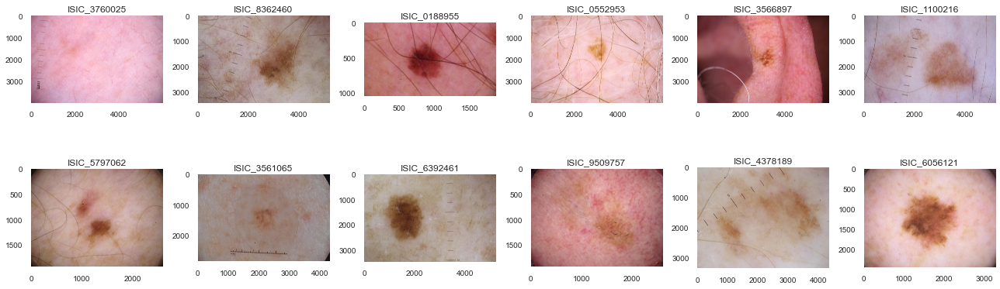

In [52]:
_train = train[train['age_approx'] >= 70].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=6)

---
## anatom_site_general_challenge

In [30]:
train['anatom_site_general_challenge'].value_counts()

torso              16845
lower extremity     8417
upper extremity     4983
head/neck           1855
palms/soles          375
oral/genital         124
Name: anatom_site_general_challenge, dtype: int64

benign:  ['ISIC_0575072', 'ISIC_8322005', 'ISIC_6583372', 'ISIC_4957985', 'ISIC_9186427', 'ISIC_6381090']
malignant:  ['ISIC_6555290', 'ISIC_9596721', 'ISIC_7327423', 'ISIC_8106899', 'ISIC_7098141', 'ISIC_4469476']


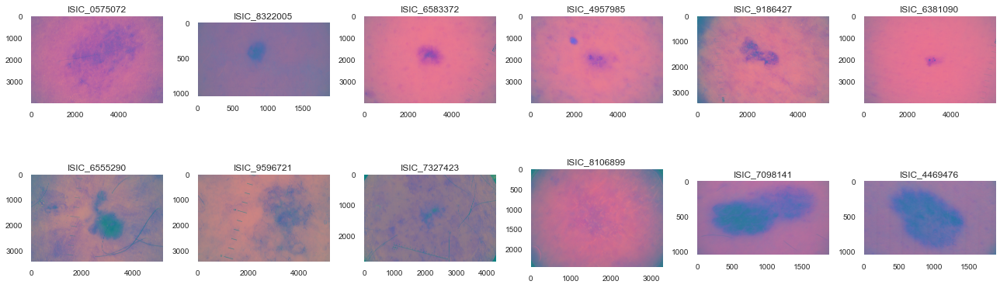

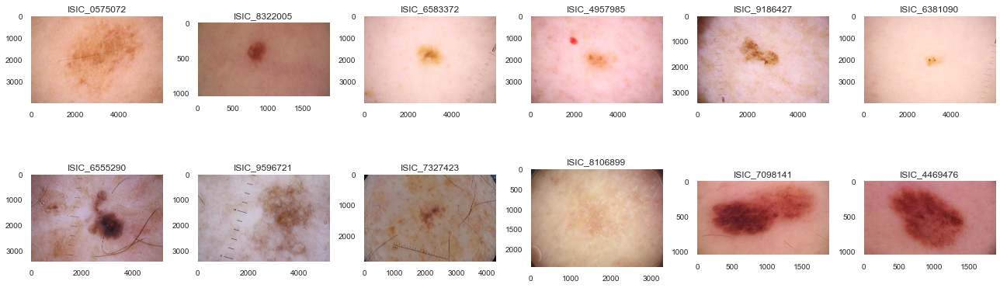

In [53]:
_train = train[train['anatom_site_general_challenge'] == 'torso'].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_3535007', 'ISIC_0711360', 'ISIC_1700029', 'ISIC_5148722', 'ISIC_6341670', 'ISIC_2238376']
malignant:  ['ISIC_2153401', 'ISIC_1620401', 'ISIC_3093026', 'ISIC_9048507', 'ISIC_5044438', 'ISIC_4120174']


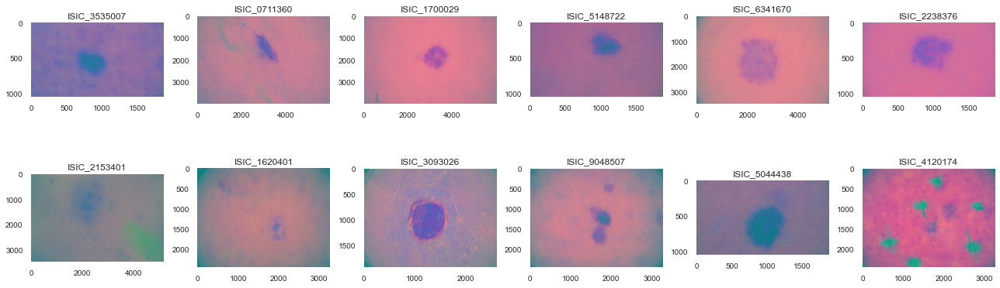

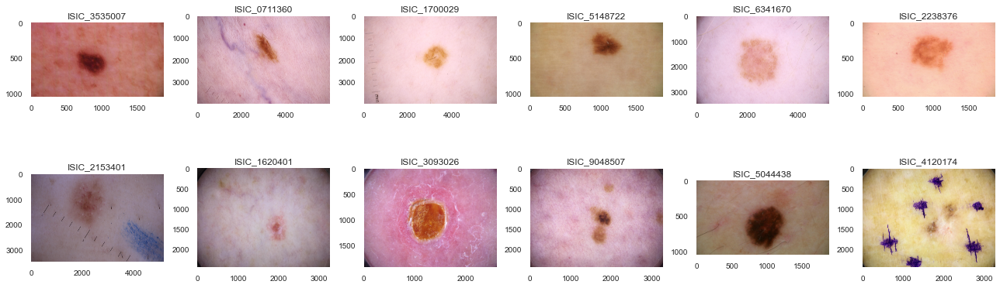

In [54]:
_train = train[train['anatom_site_general_challenge'] == 'lower extremity'].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_4187524', 'ISIC_4222843', 'ISIC_8341144', 'ISIC_8828670', 'ISIC_2800198', 'ISIC_4036621']
malignant:  ['ISIC_8789051', 'ISIC_5673518', 'ISIC_7346739', 'ISIC_9351516', 'ISIC_6509682', 'ISIC_5315062']


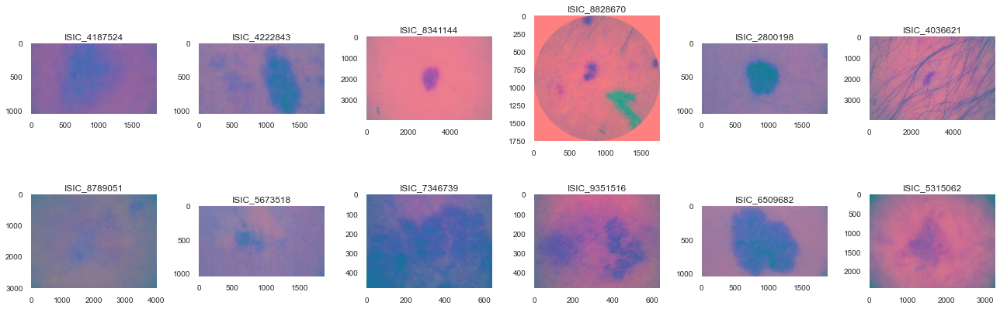

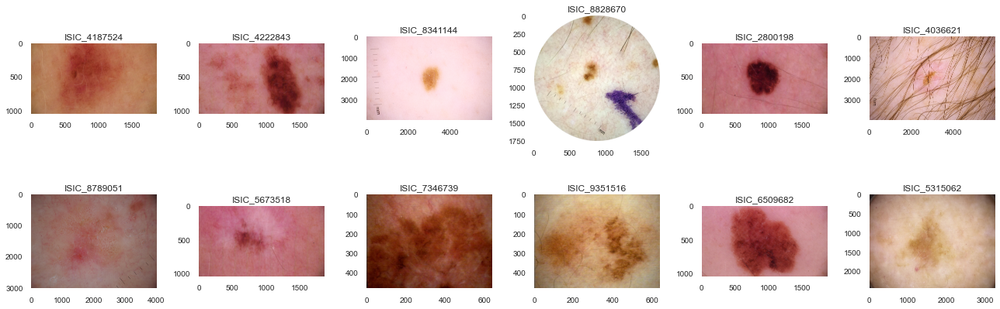

In [55]:
_train = train[train['anatom_site_general_challenge'] == 'upper extremity'].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=6)

benign:  ['ISIC_4310869', 'ISIC_5920981', 'ISIC_0360822', 'ISIC_5844800', 'ISIC_8990076']
malignant:  ['ISIC_5581931', 'ISIC_9863642', 'ISIC_8677053', 'ISIC_8527092', 'ISIC_2351999']


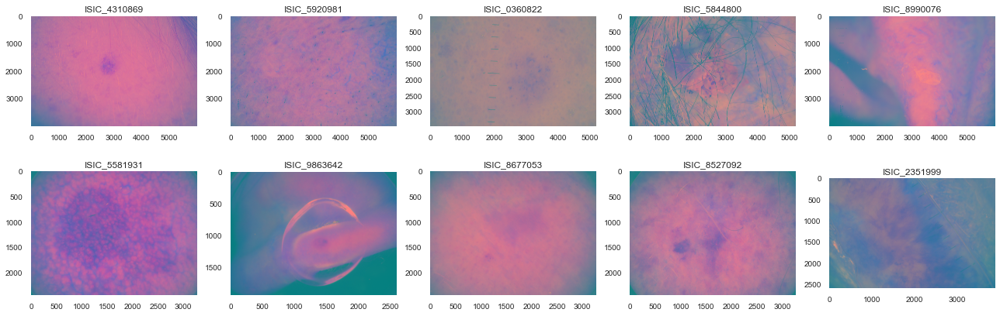

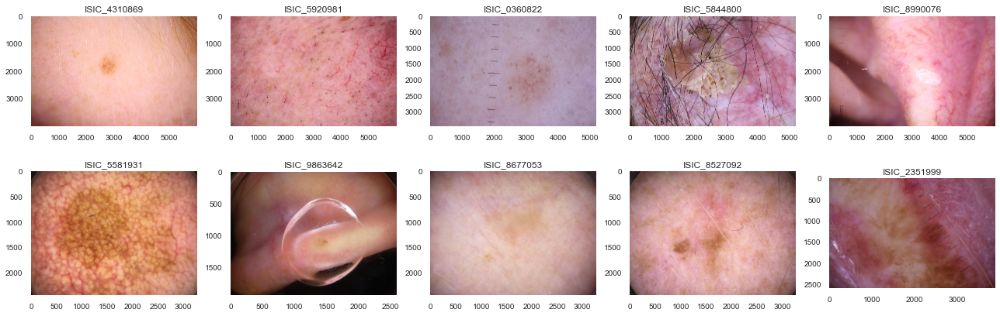

In [56]:
_train = train[train['anatom_site_general_challenge'] == 'head/neck'].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=5)

benign:  ['ISIC_1128193', 'ISIC_3260974', 'ISIC_8804606', 'ISIC_7131343', 'ISIC_3206957']
malignant:  ['ISIC_9000234', 'ISIC_8252406', 'ISIC_1162337', 'ISIC_4517738', 'ISIC_8450656']


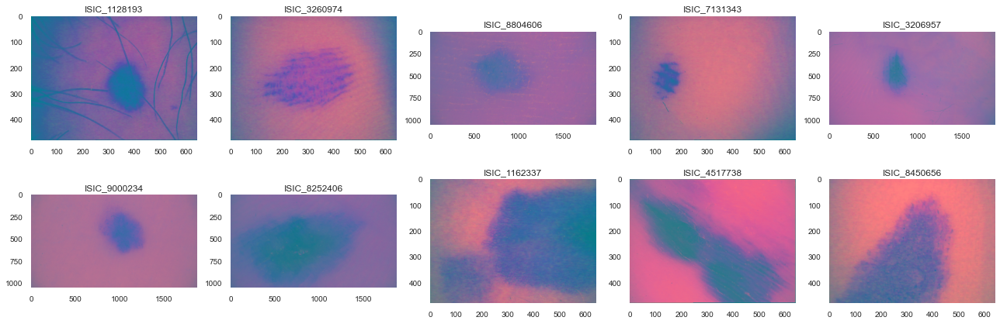

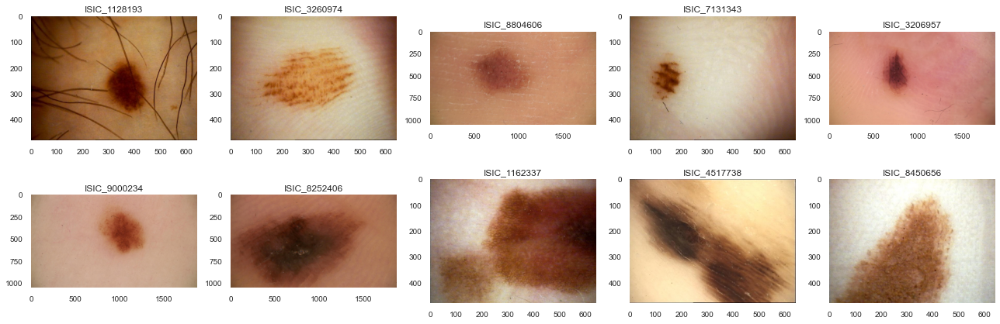

In [57]:
_train = train[train['anatom_site_general_challenge'] == 'palms/soles'].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=5)

benign:  ['ISIC_2301843', 'ISIC_1550349', 'ISIC_8172411', 'ISIC_7094320']
malignant:  ['ISIC_7295035', 'ISIC_6248008', 'ISIC_4012047', 'ISIC_6927840']


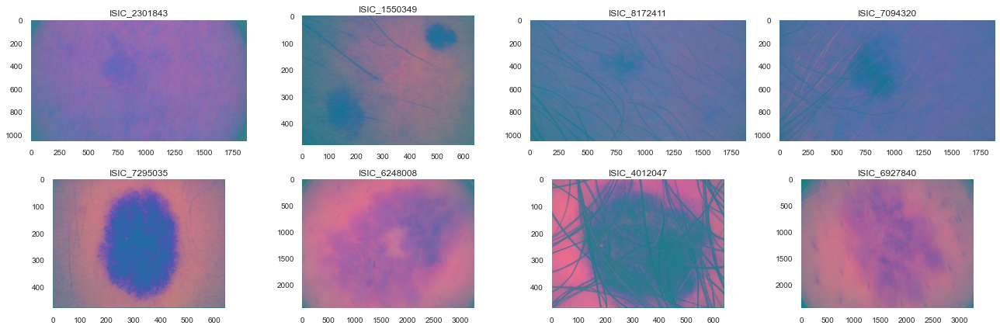

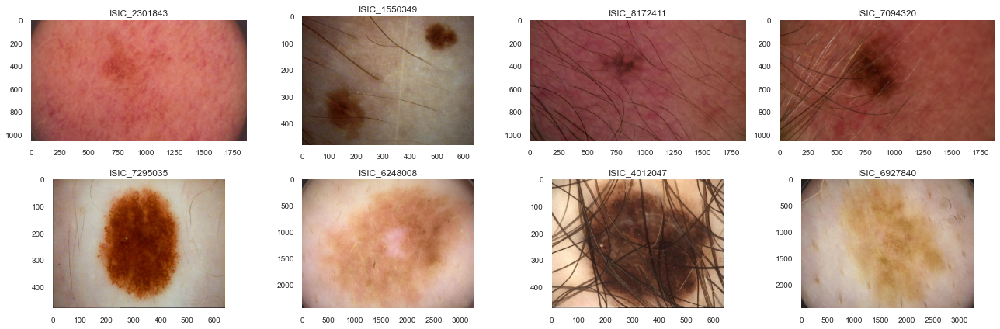

In [58]:
_train = train[train['anatom_site_general_challenge'] == 'oral/genital'].reset_index(drop=True)
get_benign_malignant_images(_train, img_num=4)

---
## Data Augmentation

In [91]:
import albumentations as albu

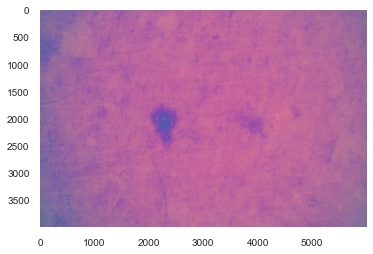

In [92]:
img = pydicom.dcmread(img_path[0])
img = img.pixel_array

plt.imshow(img)
plt.show()

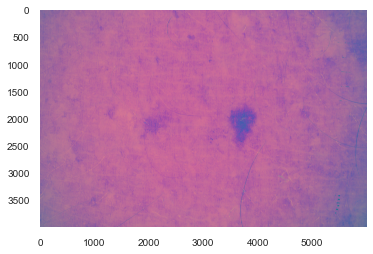

In [93]:
img_augmented = albu.HorizontalFlip(p=1)(image=img)['image']
plt.imshow(img_augmented)
plt.show()

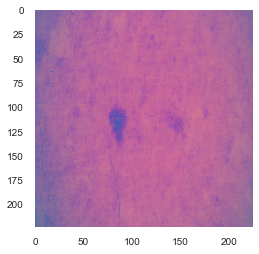

In [103]:
img_augmented = albu.Resize(224, 224, p=1)(image=img)['image']
img_augmented = albu.CenterCrop(224, 224, p=1)(image=img_augmented)['image']
plt.imshow(img_augmented)
plt.show()

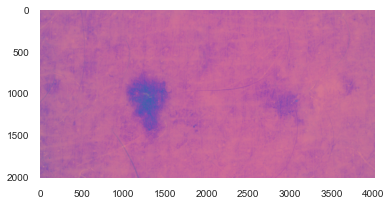

In [98]:
img_augmented = albu.CenterCrop(height=2024, width=4024, p=1)(image=img)['image']
plt.imshow(img_augmented)
plt.show()

In [104]:
img_path[:5]

['../input\\train\\ISIC_0015719.dcm',
 '../input\\train\\ISIC_0052212.dcm',
 '../input\\train\\ISIC_0068279.dcm',
 '../input\\train\\ISIC_0074268.dcm',
 '../input\\train\\ISIC_0074311.dcm']

In [109]:
tar = 'ISIC_0068279'

a = [path for path in img_path if tar in path][0]

In [110]:
a

'../input\\train\\ISIC_0068279.dcm'